In [ ]:
pip install imutils

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import imutils

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


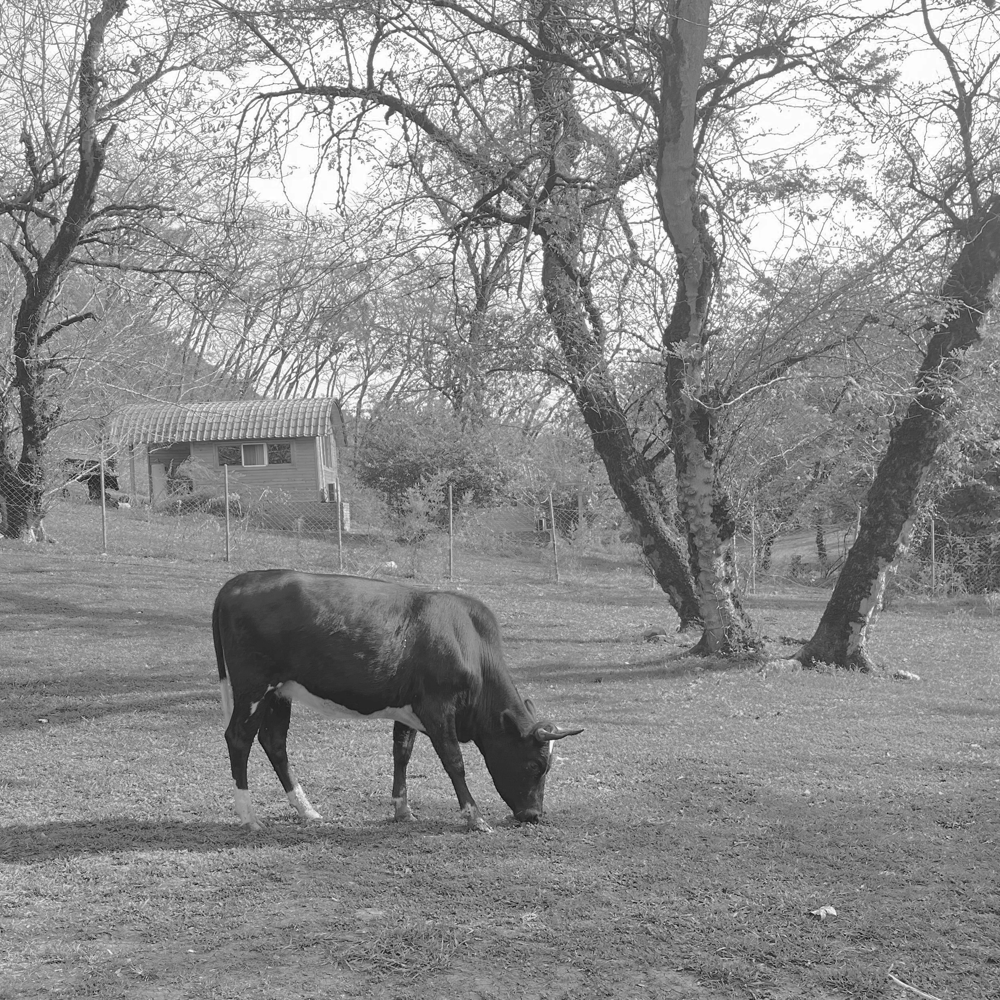

In [ ]:
# Load the image
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Sample.jpeg')
cv2_imshow(image)

Contrast Level: Moderate


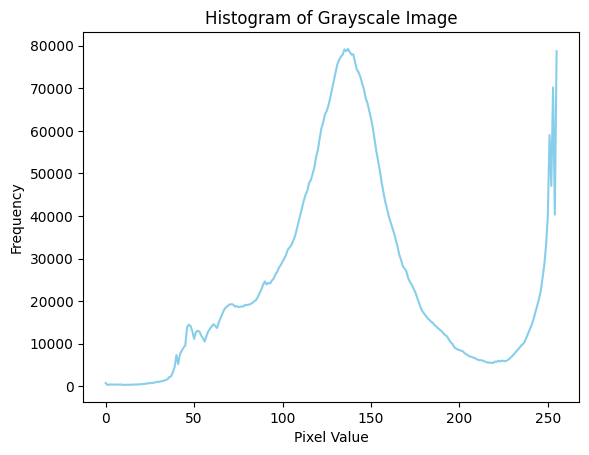

In [ ]:
# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Calculate the histogram
hist = cv2.calcHist([gray], [0], None, [256], [0, 256])

# Flatten the histogram to a 1D array
hist = hist.flatten()

# Plot the histogram
plt.plot(hist, color='skyblue')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Histogram of Grayscale Image')

# Calculate the mean and standard deviation of the pixel values
mean = np.mean(gray)
std_dev = np.std(gray)

# Determine the contrast level based on standard deviation
if std_dev < 30:
    contrast_level = 'Low'
elif std_dev < 80:
    contrast_level = 'Moderate'
else:
    contrast_level = 'High'

print(f'Contrast Level: {contrast_level}')

plt.show()

In [ ]:
def histogram_sliding_with_lib(image, alpha, beta):
    adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return adjusted_image

In [ ]:
def self_implemented_histogram_sliding(array,shift_number,shifting_side) :
 if shifting_side == "darken" :
   for i in range (len(array)) :
     for j in range (len(array[i])):
         array[i][j]+=shift_number
         if array[i][j]>255 :
             array[i][j]=255
         if array[i][j]<0   :
             array[i][j]=0
 if shifting_side == "brighten":
  for i in range (len(array)) :
    for j in range (len(array[i])):
         array[i][j]-=shift_number
         if array[i][j]>255 :
            array[i][j]=255
         if array[i][j]<0   :
            array[i][j]=0
 return array

In [ ]:
def hist_slide(im, val, ctrl):
#create the output image
    im_out = np.zeros((im.shape[0],im.shape[1],3), dtype=np.uint8)
#slide the histogram while maintaining the boundaries
    if imutils.is_gray(im):
        im = imutils.correct_gray(im)
        im_out = im.copy()
        if(ctrl == 'inc'):
            lim = 255 - val
            im_out[im_out > lim] = 255
            im_out[im_out <= lim] += val
        else:
            lim = 0 + val
            im_out[im_out < lim] = 0
            im_out[im_out >= lim] -= val
    return np.uint8(im_out)

In [ ]:
# Appling histogram sliding library for darkening (example: alpha < 1, beta < 0)
darkened_image1 = histogram_sliding_with_lib(image, alpha=0.8, beta=-30)

# Appling histogram sliding library for brightening (example: alpha > 1, beta > 0)
brightened_image1 = histogram_sliding_with_lib(image, alpha=1.2, beta=30)

In [ ]:
# Apply histogram sliding implemented by me
darkend_image2 = self_implemented_histogram_sliding(gray,100,"darken")
# darkend_image2 = hist_slide(gray,50,"inc")
# Apply histogram sliding implemented by m
brightened_image2 = self_implemented_histogram_sliding(gray,100,"brighten")
#brightened_image2 = hist_slide(gray,50,"dec")

In [ ]:
cv2_imshow(darkened_image1)

[]

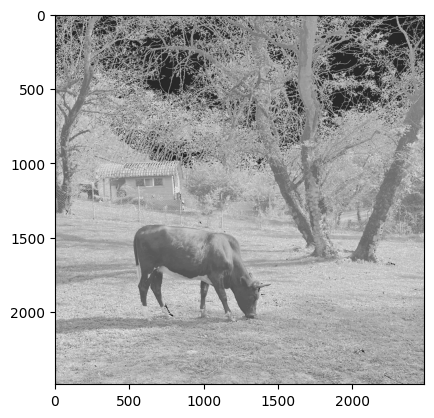

In [ ]:
plt.imshow(darkend_image2, cmap='gray')
plt.plot()

In [ ]:
cv2_imshow(brightened_image1)

[]

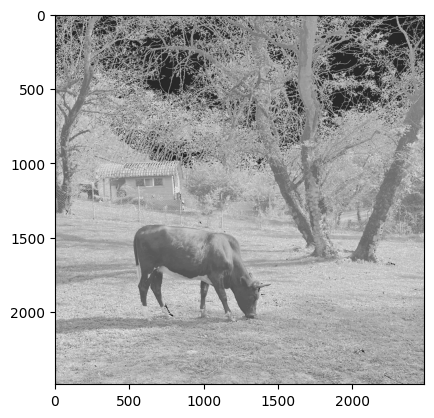

In [ ]:
plt.imshow(brightened_image2, cmap='gray')
plt.plot()

[]

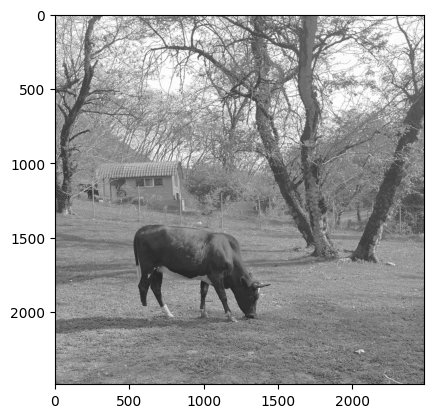

In [ ]:
# Display the original, darkened, and brightened images modified with library
plt.imshow(image, cmap='gray')
plt.plot()

In [ ]:
numpydata = np.asarray(gray)

In [ ]:
r_s =[0] * 256
for i in range(len(numpydata)):
  for j in range(len(numpydata[i])):
    r_s[numpydata[i][j]] += 1

In [ ]:
for i in range(len(r_s)):
  if i != 0:
    r_s[i] += r_s[i-1]

In [ ]:
for i in range(len(r_s)):
   r_s[i] = r_s[i] / r_s[len(r_s)-1]
   r_s[i] *= 255

In [ ]:
data = [[0]*2485] * 2485
arr = np.array(data)

for i in range(len(arr)):
  for j in range(len(arr[i])):
    arr[i][j] = numpydata[i][j]

In [ ]:
for i in range(len(numpydata)):
  for j in range(len(numpydata[i])):
    arr[i][j] = r_s[numpydata[i][j]]

[]

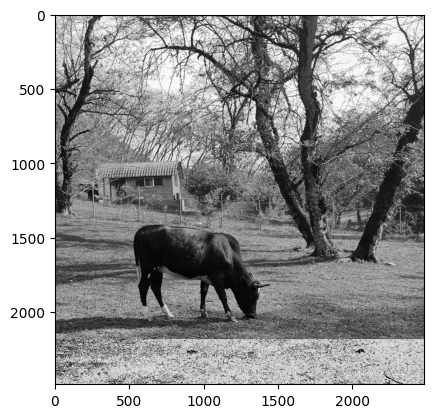

In [ ]:
plt.imshow(arr, cmap='gray')
plt.plot()